# Comparison of PTC Twiss optics for:
- Low Energy Quadrupole (LEQ) tune control
- Pole Face Windings (PFW) tune control
- For horizontal and vertical simulation scans

### imports

In [1]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
from scipy import interpolate
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

### Function Definitions

In [2]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [3]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [4]:
########################################################################
# Read PTC Twiss and return dictionary of columns/values
########################################################################
def Read_PTC_Twiss_Return_Dict(filename, verbose=False):
    # Dictionary for output
    d = dict()
    d['HEADER_FILENAME'] = [filename]
    keywords = ''
    
    # First we open and count header lines
    fin0=open(filename,'r').readlines()
    headerlines = 0
    for l in fin0:
        # Store each header line
        headerlines = headerlines + 1
        # Stop if we find the line starting '* NAME'
        if '* NAME' in l:
            keywords = l
            break
        # Store the headers as d['HEADER_<name>'] = <value>
        else:
            #try:
            #    d[str('HEADER_'+l.split()[1])]=[float(l.split()[-1])]     
            #except ValueError:
            #    d[str('HEADER_'+l.split()[1])]=[str(l.split()[-1])]   
            if '"' in l:
                d[str('HEADER_'+l.split()[1])]=[str(l.split('"')[1])]
            else:
                d[str('HEADER_'+l.split()[1])]=[float(l.split()[-1])]                 
    headerlines = headerlines + 1    
    
    if verbose: print '\nRead_PTC_Twiss_Return_Dict found Keywords: \n',keywords
    
    # Make a list of column keywords to return (as an aid to iterating)
    dict_keys = []
    for key in keywords.split():
        dict_keys.append(key)
    dict_keys.remove('*')
    
    if verbose: print '\nRead_PTC_Twiss_Return_Dict Dict Keys: \n',dict_keys
    
    # Initialise empty dictionary entries for column keywords 
    for key in dict_keys:
        d[key]=[]
        
    if verbose: 
        print '\nRead_PTC_Twiss_Return_Dict header only dictionary \n'
        for i in d:
            print i, d[i]
    
    # Strip header
    fin1=open(filename,'r').readlines()[headerlines:]   
    
    # Populate the dictionary line by line
    for l in fin1:
        i = -1        
        for value in l.split():
            i = i+1
            if 'NAME' in dict_keys[i]:
                d[dict_keys[i]].append(str(value))
            else:
                d[dict_keys[i]].append(float(value))    
                
    # Return list of column keywords 'dict_keys', and dictionary 'd'
    return dict_keys, d

In [5]:
def print_Twiss_Dict_Parameter(d, parameter, sig_limit=3):
    print parameter, ' = ', round_sig(d[parameter][0],sig_limit) 

def print_Twiss_Dict_Tunes(d, sig_limit=3):
    print '(Qx, Qy) = (', round_sig(d['HEADER_Q1'][0],sig_limit) , ',' , round_sig(d['HEADER_Q2'][0],sig_limit) , ')'
    

### Plot Parameters

In [6]:
plt.rcParams['figure.figsize'] = [8.0, 5.0]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['lines.markersize'] = 5

In [7]:
save_folder = 'Plots/'
make_directory(save_folder)

Creation of the directory Plots/ failed


In [8]:
legend_label = 'Case'
main_label = 'MD4224'

In [9]:
beta = 0.9158

## Load H LEQ simulation twiss files

In [10]:
LEQ_H_07_keys, LEQ_H_07 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_07_24/optimised_leq_final_h.tfs')
LEQ_H_08_keys, LEQ_H_08 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_08_24/optimised_leq_final_h.tfs')
LEQ_H_09_keys, LEQ_H_09 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_09_24/optimised_leq_final_h.tfs')
LEQ_H_10_keys, LEQ_H_10 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_10_24/optimised_leq_final_h.tfs')
LEQ_H_11_keys, LEQ_H_11 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_11_24/optimised_leq_final_h.tfs')
LEQ_H_12_keys, LEQ_H_12 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_12_24/optimised_leq_final_h.tfs')
LEQ_H_13_keys, LEQ_H_13 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_13_24/optimised_leq_final_h.tfs')
LEQ_H_14_keys, LEQ_H_14 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_14_24/optimised_leq_final_h.tfs')
LEQ_H_15_keys, LEQ_H_15 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_15_24/optimised_leq_final_h.tfs')
LEQ_H_16_keys, LEQ_H_16 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_16_24/optimised_leq_final_h.tfs')
LEQ_H_17_keys, LEQ_H_17 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_17_24/optimised_leq_final_h.tfs')
LEQ_H_18_keys, LEQ_H_18 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_18_24/optimised_leq_final_h.tfs')
LEQ_H_19_keys, LEQ_H_19 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_19_24/optimised_leq_final_h.tfs')
LEQ_H_20_keys, LEQ_H_20 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_20_24/optimised_leq_final_h.tfs')
LEQ_H_21_keys, LEQ_H_21 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_21_24/optimised_leq_final_h.tfs')
LEQ_H_List = [LEQ_H_07, LEQ_H_08, LEQ_H_09, LEQ_H_10, LEQ_H_11, LEQ_H_12, LEQ_H_13, LEQ_H_14, LEQ_H_15, LEQ_H_16, LEQ_H_17, LEQ_H_18, LEQ_H_19, LEQ_H_20, LEQ_H_21]

In [11]:
for d in LEQ_H_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.069 , 0.24 )
(Qx, Qy) = ( 0.079 , 0.24 )
(Qx, Qy) = ( 0.09 , 0.24 )
(Qx, Qy) = ( 0.1 , 0.24 )
(Qx, Qy) = ( 0.11 , 0.24 )
(Qx, Qy) = ( 0.12 , 0.24 )
(Qx, Qy) = ( 0.13 , 0.24 )
(Qx, Qy) = ( 0.14 , 0.24 )
(Qx, Qy) = ( 0.15 , 0.24 )
(Qx, Qy) = ( 0.16 , 0.24 )
(Qx, Qy) = ( 0.17 , 0.24 )
(Qx, Qy) = ( 0.18 , 0.24 )
(Qx, Qy) = ( 0.19 , 0.24 )
(Qx, Qy) = ( 0.2 , 0.24 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load V LEQ simulation twiss files

In [12]:
LEQ_V_10_keys, LEQ_V_10 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_10/optimised_leq_final_v.tfs')
LEQ_V_11_keys, LEQ_V_11 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_11/optimised_leq_final_v.tfs')
LEQ_V_12_keys, LEQ_V_12 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_12/optimised_leq_final_v.tfs')
LEQ_V_13_keys, LEQ_V_13 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_13/optimised_leq_final_v.tfs')
LEQ_V_14_keys, LEQ_V_14 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_14/optimised_leq_final_v.tfs')
LEQ_V_15_keys, LEQ_V_15 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_15/optimised_leq_final_v.tfs')
LEQ_V_16_keys, LEQ_V_16 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_16/optimised_leq_final_v.tfs')
LEQ_V_17_keys, LEQ_V_17 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_17/optimised_leq_final_v.tfs')
LEQ_V_18_keys, LEQ_V_18 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_18/optimised_leq_final_v.tfs')
LEQ_V_19_keys, LEQ_V_19 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_19/optimised_leq_final_v.tfs')
LEQ_V_20_keys, LEQ_V_20 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_20/optimised_leq_final_v.tfs')
LEQ_V_21_keys, LEQ_V_21 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_21/optimised_leq_final_v.tfs')
LEQ_V_22_keys, LEQ_V_22 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_22/optimised_leq_final_v.tfs')
LEQ_V_23_keys, LEQ_V_23 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_23/optimised_leq_final_v.tfs')
LEQ_V_24_keys, LEQ_V_24 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_24/optimised_leq_final_v.tfs')
LEQ_V_List = [LEQ_V_10, LEQ_V_11, LEQ_V_12, LEQ_V_13, LEQ_V_14, LEQ_V_15, LEQ_V_16, LEQ_V_17, LEQ_V_18, LEQ_V_19, LEQ_V_20, LEQ_V_21, LEQ_V_22, LEQ_V_23, LEQ_V_24]

In [13]:
for d in LEQ_V_List:
    print_Twiss_Dict_Tunes(d)

(Qx, Qy) = ( 0.21 , 0.1 )
(Qx, Qy) = ( 0.21 , 0.11 )
(Qx, Qy) = ( 0.21 , 0.12 )
(Qx, Qy) = ( 0.21 , 0.13 )
(Qx, Qy) = ( 0.21 , 0.14 )
(Qx, Qy) = ( 0.21 , 0.15 )
(Qx, Qy) = ( 0.21 , 0.16 )
(Qx, Qy) = ( 0.21 , 0.17 )
(Qx, Qy) = ( 0.21 , 0.18 )
(Qx, Qy) = ( 0.21 , 0.19 )
(Qx, Qy) = ( 0.21 , 0.2 )
(Qx, Qy) = ( 0.21 , 0.21 )
(Qx, Qy) = ( 0.21 , 0.22 )
(Qx, Qy) = ( 0.21 , 0.23 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load H PFW simulation twiss files

In [14]:
PFW_H_07_keys, PFW_H_07 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_07_24/optimised_flat_file.tfs')
PFW_H_08_keys, PFW_H_08 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_08_24/optimised_flat_file.tfs')
PFW_H_09_keys, PFW_H_09 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_09_24/optimised_flat_file.tfs')
PFW_H_10_keys, PFW_H_10 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_10_24/optimised_flat_file.tfs')
PFW_H_11_keys, PFW_H_11 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_11_24/optimised_flat_file.tfs')
PFW_H_12_keys, PFW_H_12 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_12_24/optimised_flat_file.tfs')
PFW_H_13_keys, PFW_H_13 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_13_24/optimised_flat_file.tfs')
PFW_H_14_keys, PFW_H_14 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_14_24/optimised_flat_file.tfs')
PFW_H_15_keys, PFW_H_15 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_15_24/optimised_flat_file.tfs')
PFW_H_16_keys, PFW_H_16 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_16_24/optimised_flat_file.tfs')
PFW_H_17_keys, PFW_H_17 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_17_24/optimised_flat_file.tfs')
PFW_H_18_keys, PFW_H_18 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_18_24/optimised_flat_file.tfs')
PFW_H_19_keys, PFW_H_19 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_19_24/optimised_flat_file.tfs')
PFW_H_20_keys, PFW_H_20 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_20_24/optimised_flat_file.tfs')
PFW_H_21_keys, PFW_H_21 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_21_24/optimised_flat_file.tfs')
PFW_H_List = [PFW_H_07, PFW_H_08, PFW_H_09, PFW_H_10, PFW_H_11, PFW_H_12, PFW_H_13, PFW_H_14, PFW_H_15, PFW_H_16, PFW_H_17, PFW_H_18, PFW_H_19, PFW_H_20, PFW_H_21]

In [15]:
for d in PFW_H_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.07 , 0.24 )
(Qx, Qy) = ( 0.08 , 0.24 )
(Qx, Qy) = ( 0.09 , 0.24 )
(Qx, Qy) = ( 0.1 , 0.24 )
(Qx, Qy) = ( 0.11 , 0.24 )
(Qx, Qy) = ( 0.12 , 0.24 )
(Qx, Qy) = ( 0.13 , 0.24 )
(Qx, Qy) = ( 0.14 , 0.24 )
(Qx, Qy) = ( 0.15 , 0.24 )
(Qx, Qy) = ( 0.16 , 0.24 )
(Qx, Qy) = ( 0.17 , 0.24 )
(Qx, Qy) = ( 0.18 , 0.24 )
(Qx, Qy) = ( 0.19 , 0.24 )
(Qx, Qy) = ( 0.2 , 0.24 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load V PFW simulation twiss files

In [16]:
PFW_V_10_keys, PFW_V_10 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_10/optimised_flat_file.tfs')
PFW_V_11_keys, PFW_V_11 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_11/optimised_flat_file.tfs')
PFW_V_12_keys, PFW_V_12 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_12/optimised_flat_file.tfs')
PFW_V_13_keys, PFW_V_13 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_13/optimised_flat_file.tfs')
PFW_V_14_keys, PFW_V_14 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_14/optimised_flat_file.tfs')
PFW_V_15_keys, PFW_V_15 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_15/optimised_flat_file.tfs')
PFW_V_16_keys, PFW_V_16 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_16/optimised_flat_file.tfs')
PFW_V_17_keys, PFW_V_17 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_17/optimised_flat_file.tfs')
PFW_V_18_keys, PFW_V_18 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_18/optimised_flat_file.tfs')
PFW_V_19_keys, PFW_V_19 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_19/optimised_flat_file.tfs')
PFW_V_20_keys, PFW_V_20 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_20/optimised_flat_file.tfs')
PFW_V_21_keys, PFW_V_21 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_21/optimised_flat_file.tfs')
PFW_V_22_keys, PFW_V_22 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_22/optimised_flat_file.tfs')
PFW_V_23_keys, PFW_V_23 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_23/optimised_flat_file.tfs')
PFW_V_24_keys, PFW_V_24 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_24/optimised_flat_file.tfs')
PFW_V_List = [PFW_V_10, PFW_V_11, PFW_V_12, PFW_V_13, PFW_V_14, PFW_V_15, PFW_V_16, PFW_V_17, PFW_V_18, PFW_V_19, PFW_V_20, PFW_V_21, PFW_V_22, PFW_V_23, PFW_V_24]

In [17]:
for d in PFW_V_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.21 , 0.1 )
(Qx, Qy) = ( 0.21 , 0.11 )
(Qx, Qy) = ( 0.21 , 0.12 )
(Qx, Qy) = ( 0.21 , 0.13 )
(Qx, Qy) = ( 0.21 , 0.14 )
(Qx, Qy) = ( 0.21 , 0.15 )
(Qx, Qy) = ( 0.21 , 0.16 )
(Qx, Qy) = ( 0.21 , 0.17 )
(Qx, Qy) = ( 0.21 , 0.18 )
(Qx, Qy) = ( 0.21 , 0.19 )
(Qx, Qy) = ( 0.21 , 0.2 )
(Qx, Qy) = ( 0.21 , 0.21 )
(Qx, Qy) = ( 0.21 , 0.22 )
(Qx, Qy) = ( 0.21 , 0.23 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load PFW + Quadrupole Error Sims

In [18]:
PFW_V_10_0pc_keys, PFW_V_10_0pc = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_10/optimised_flat_file.tfs')
PFW_V_10_5pc_keys, PFW_V_10_5pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_5pc_beta_beating.tfs')
PFW_V_10_10pc_keys, PFW_V_10_10pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_10pc_beta_beating.tfs')
PFW_V_10_15pc_keys, PFW_V_10_15pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_15pc_beta_beating.tfs')
PFW_V_10_20pc_keys, PFW_V_10_20pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_20pc_beta_beating.tfs')


PFW_Quad_List = [PFW_V_10_20pc, PFW_V_10_15pc, PFW_V_10_10pc, PFW_V_10_5pc, PFW_V_10_0pc]

In [19]:
for d in PFW_Quad_List:
    print_Twiss_Dict_Tunes(d,2)
    print_Twiss_Dict_Parameter(d, 'HEADER_BETA_Y_MAX')

(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  28.0
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  26.6
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  25.4
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  24.2
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  23.0


# Plot simple optics for each scan

###  LEQ Vertical

In [20]:
LEQ_V_21_keys

['NAME', 'S', 'BETX', 'BETY', 'DISP1', 'DISP3', 'X', 'PX', 'Y', 'PY']

In [21]:
main_label = 'MD4224'
case_label = 'LEQ Vertical Scan'
save_folder = 'LEQ_Vertical/'
make_directory(save_folder)

Creation of the directory LEQ_Vertical/ failed


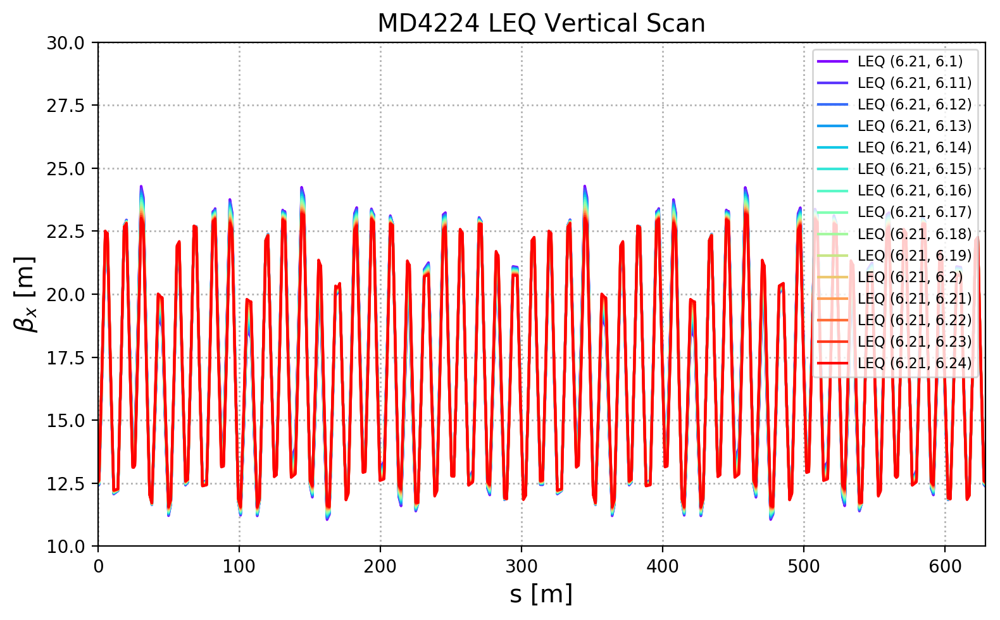

In [22]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

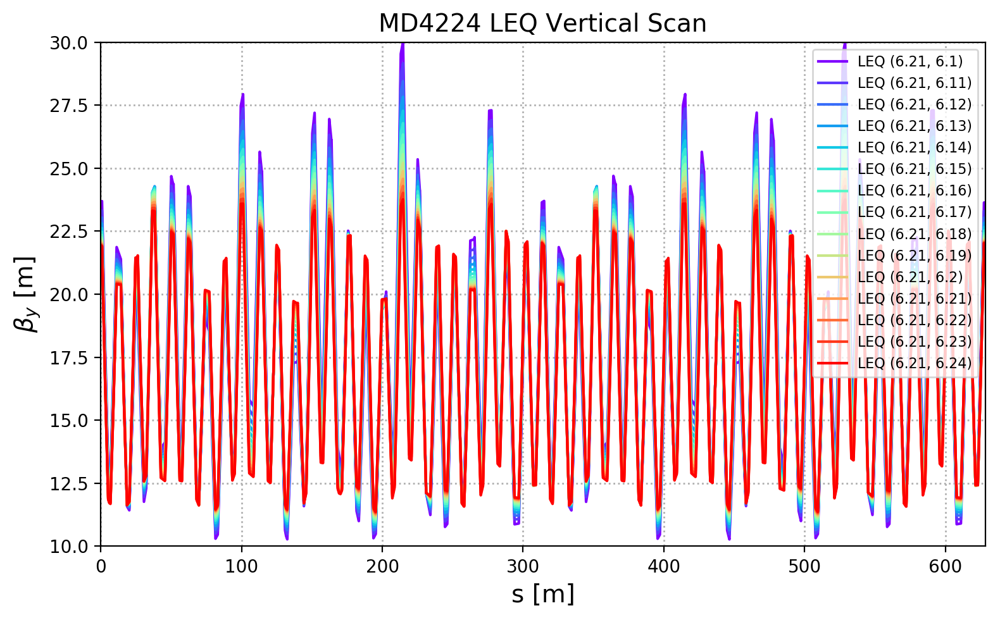

In [23]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

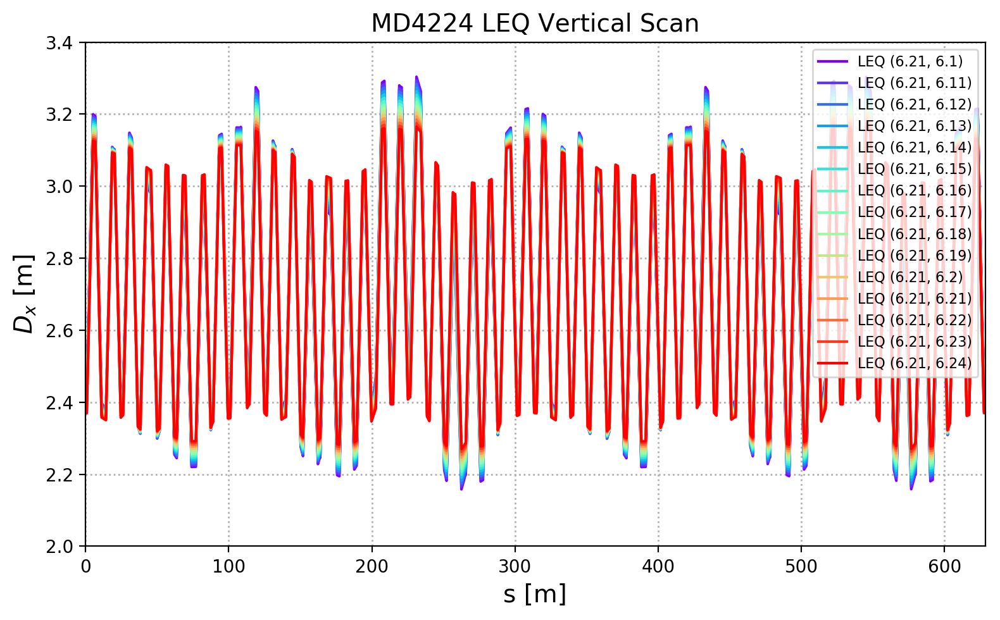

In [24]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(2.0, 3.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

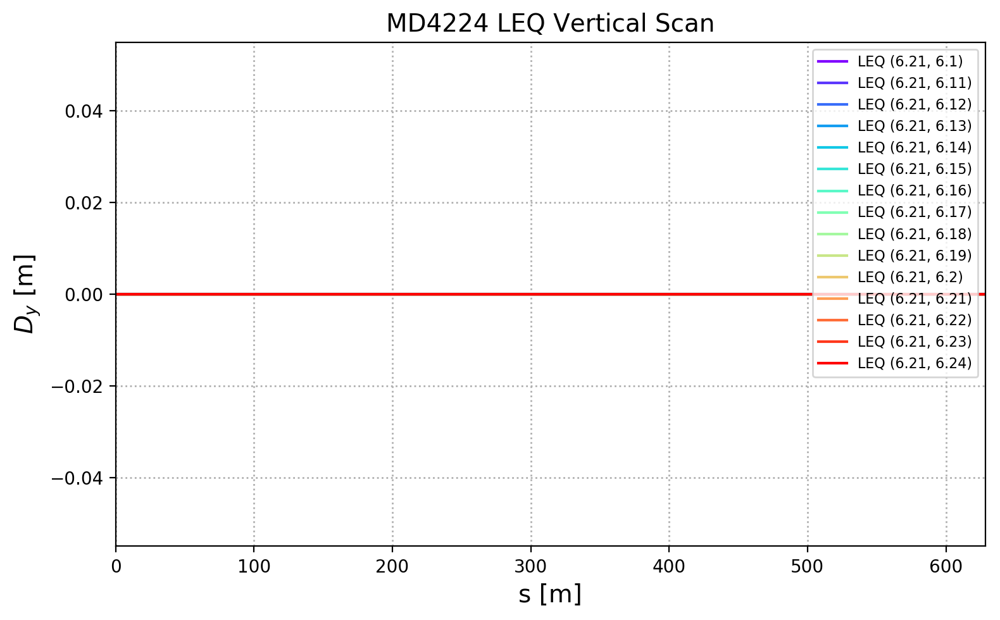

In [25]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label 
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

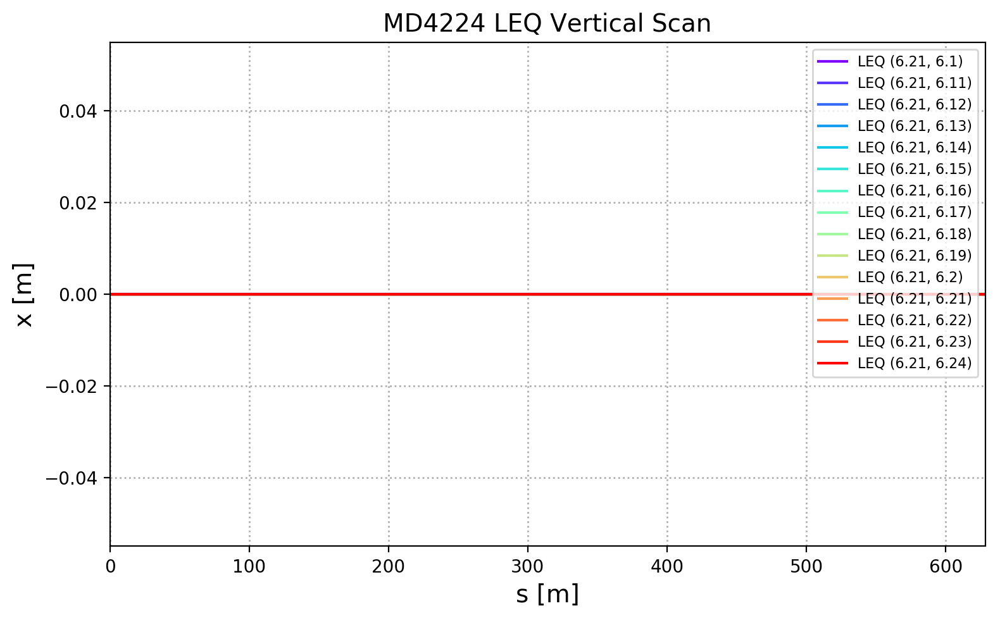

In [26]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label 
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

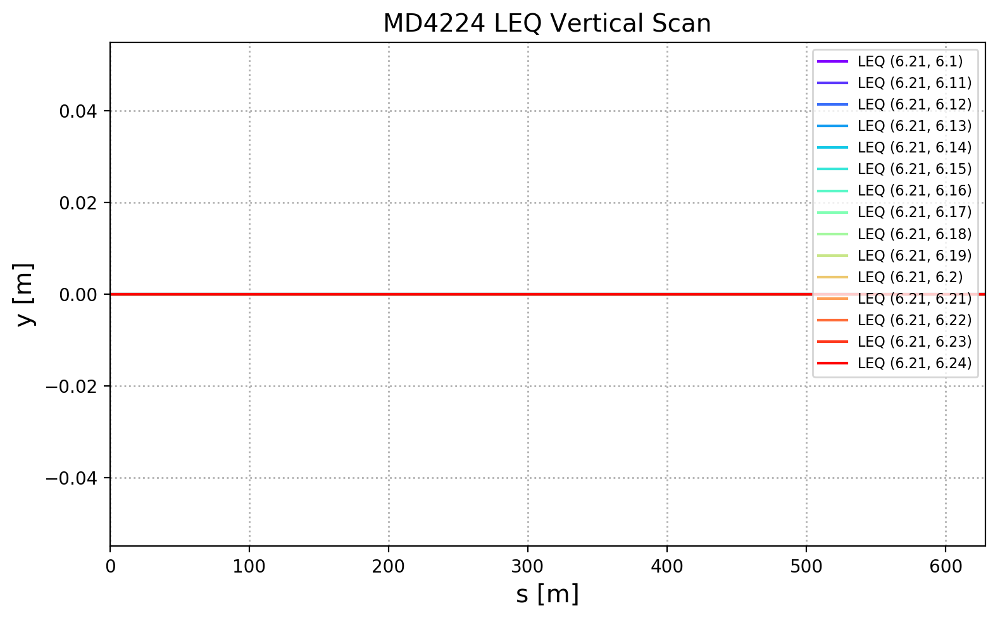

In [27]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label 
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

### LEQ Horizontal

In [28]:
main_label = 'MD4224'
case_label = 'LEQ Horizontal Scan'
save_folder = 'LEQ_Horizontal/'
make_directory(save_folder)

Creation of the directory LEQ_Horizontal/ failed


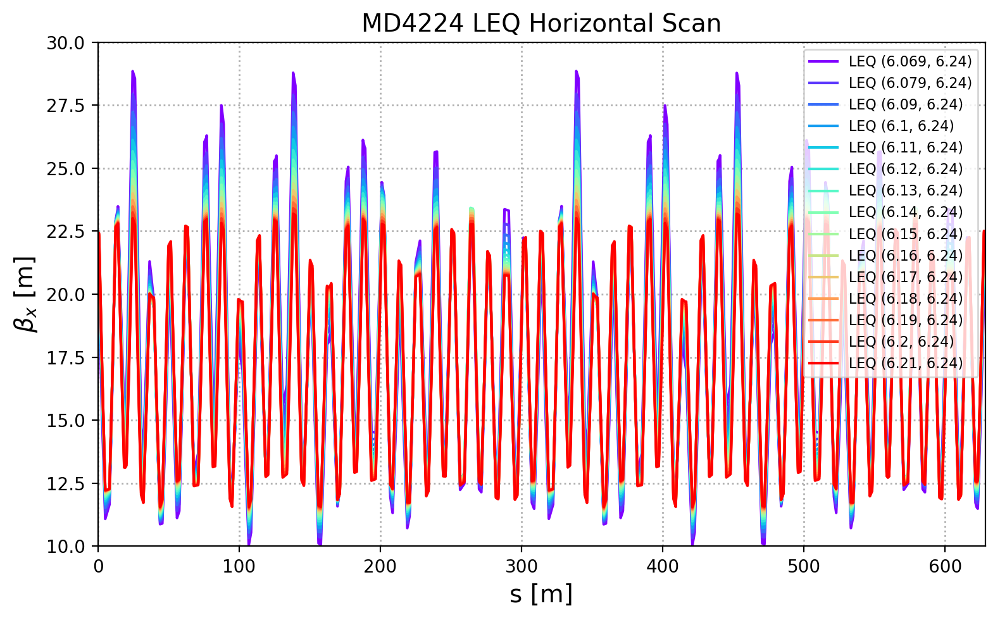

In [29]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

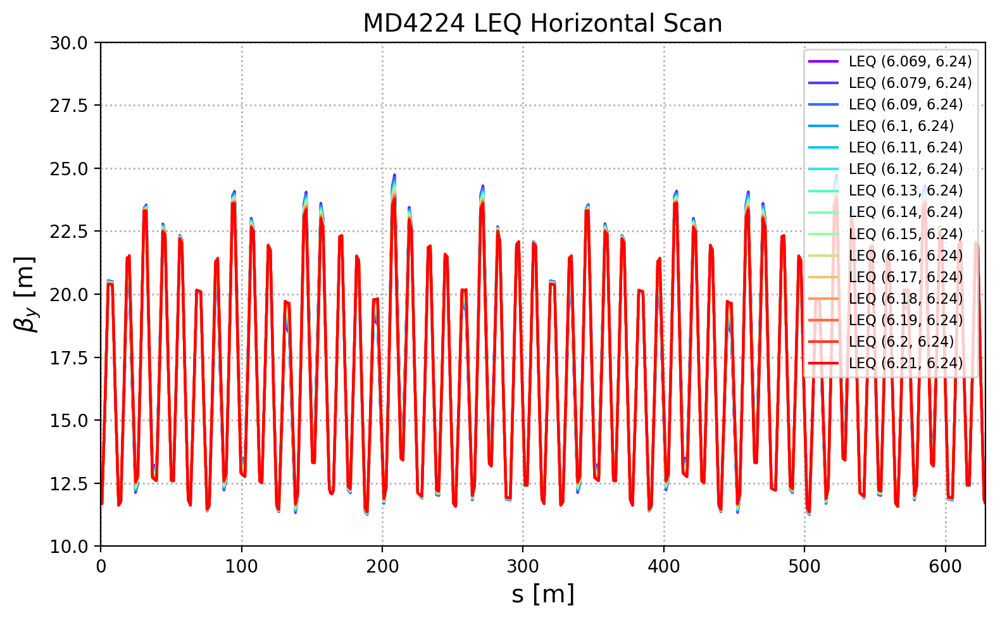

In [30]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

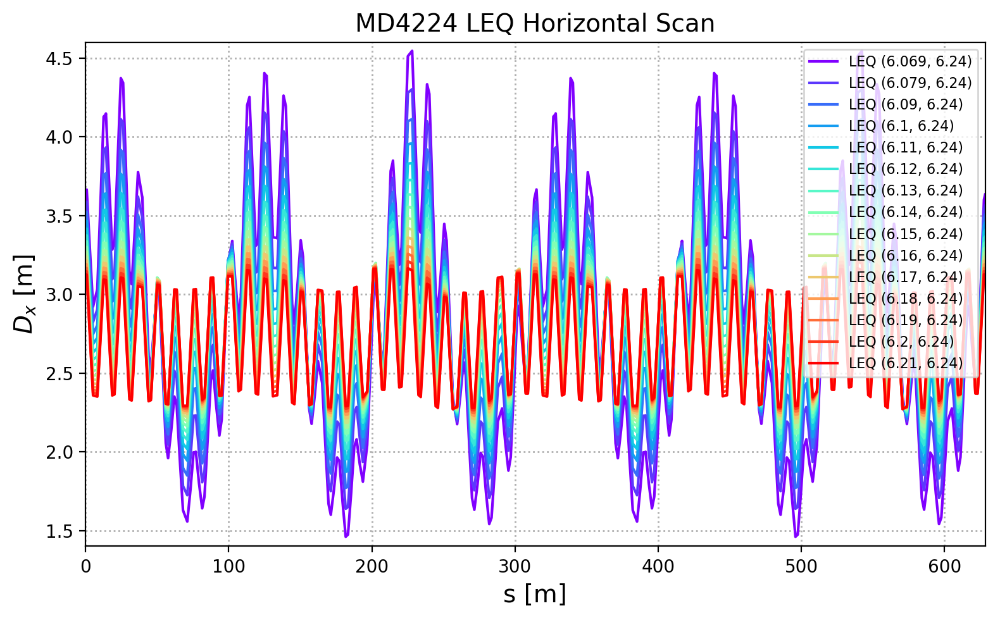

In [31]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(1.4, 4.6)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

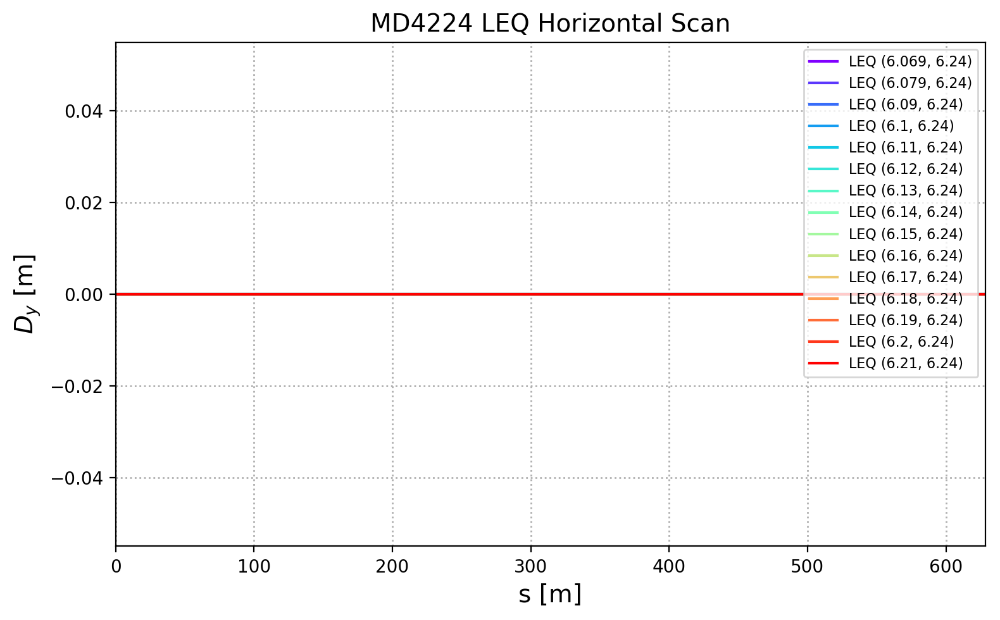

In [32]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

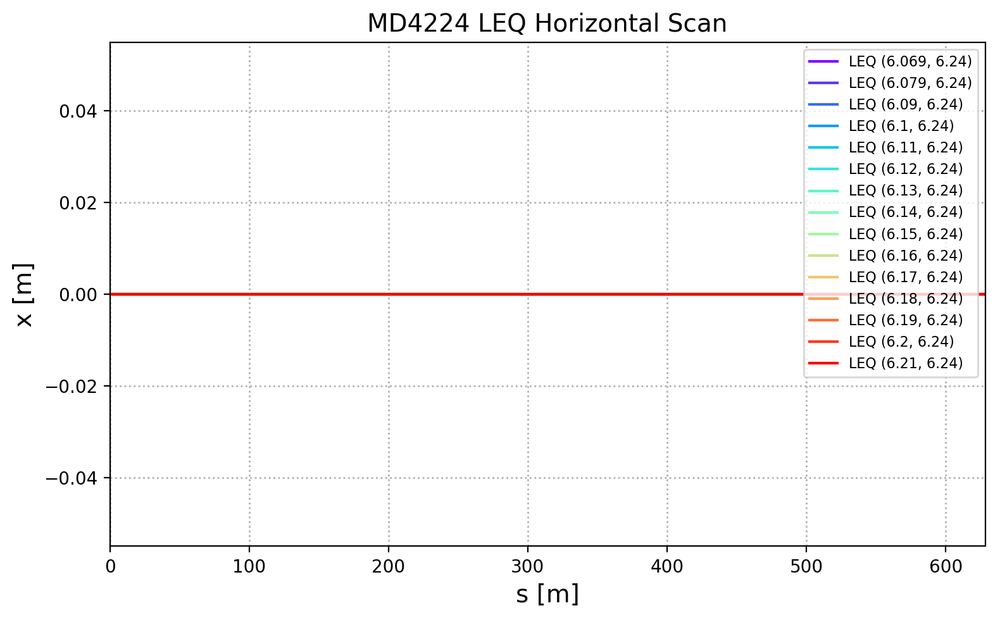

In [33]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

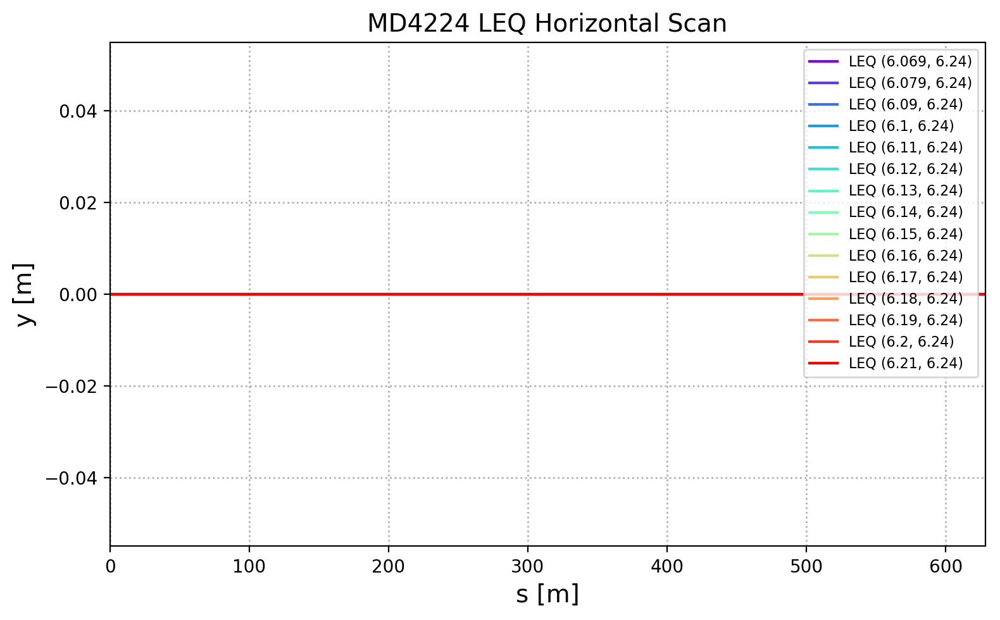

In [34]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

### PFW Vertical

In [35]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan'
save_folder = 'PFW_Vertical/'
make_directory(save_folder)

Creation of the directory PFW_Vertical/ failed


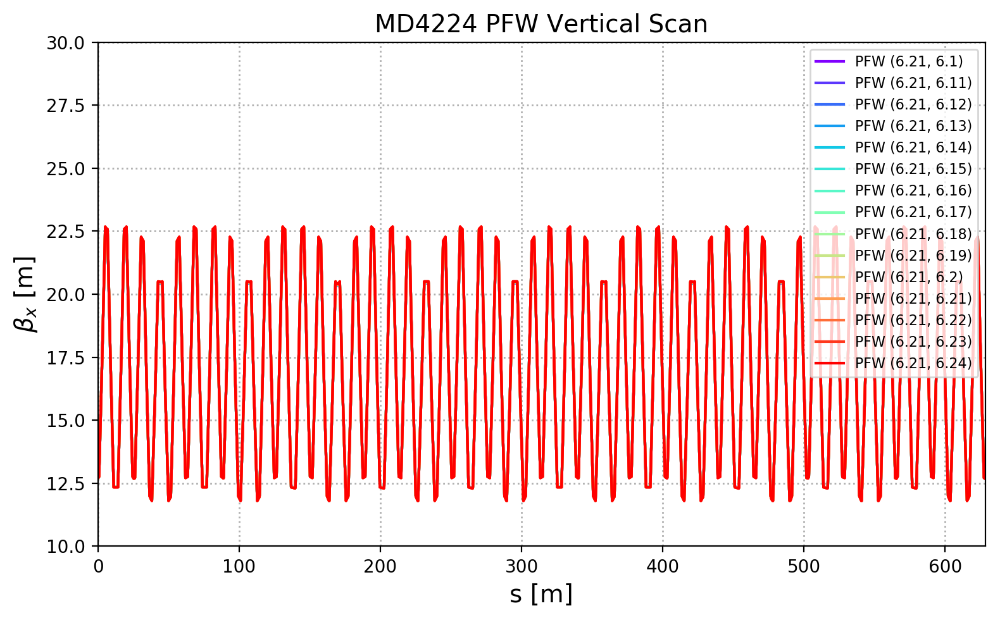

In [36]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

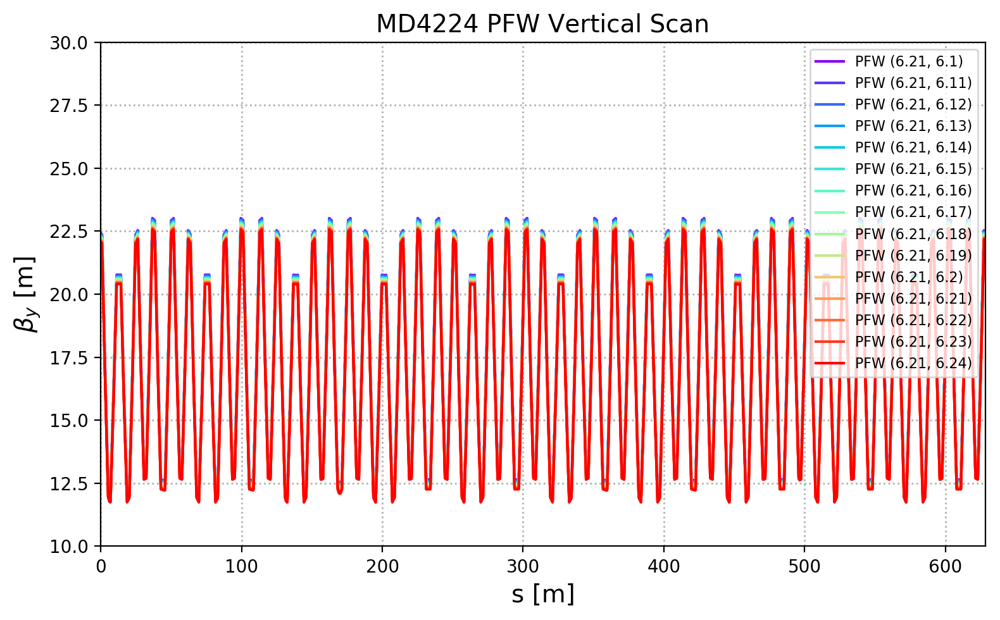

In [37]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

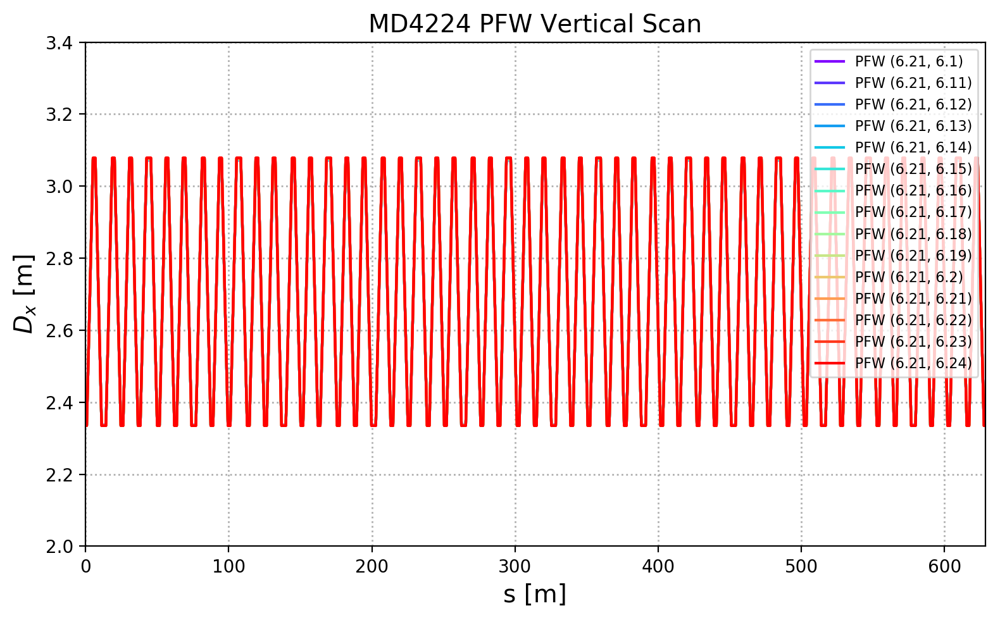

In [38]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(2.0, 3.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

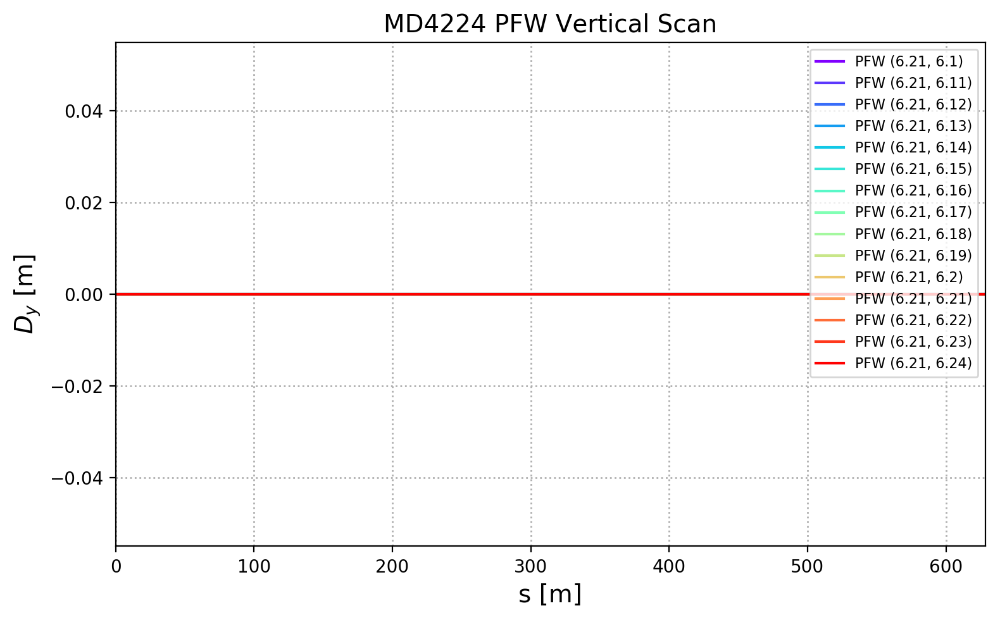

In [39]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

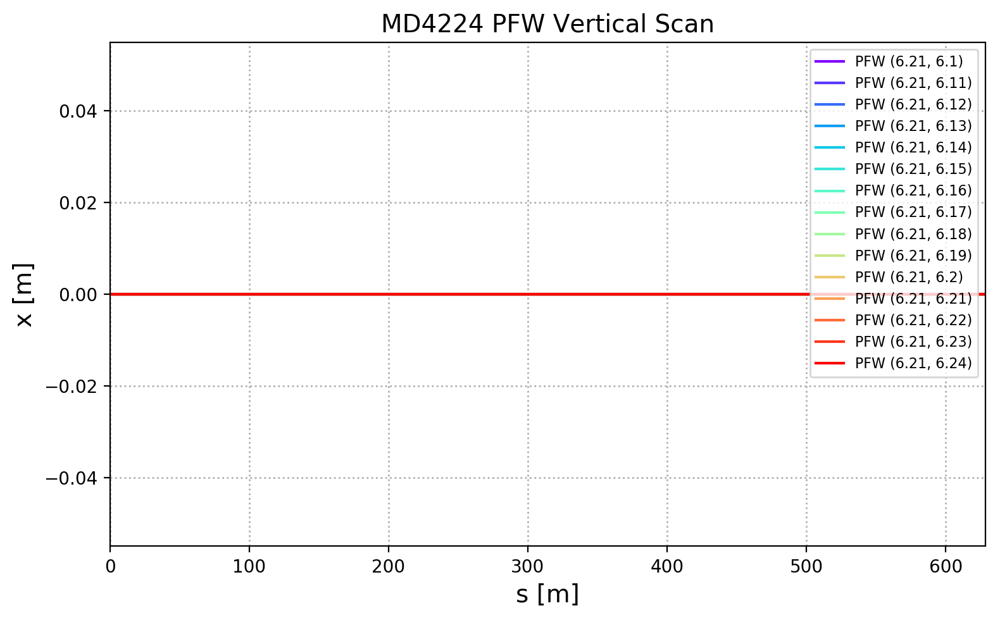

In [40]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

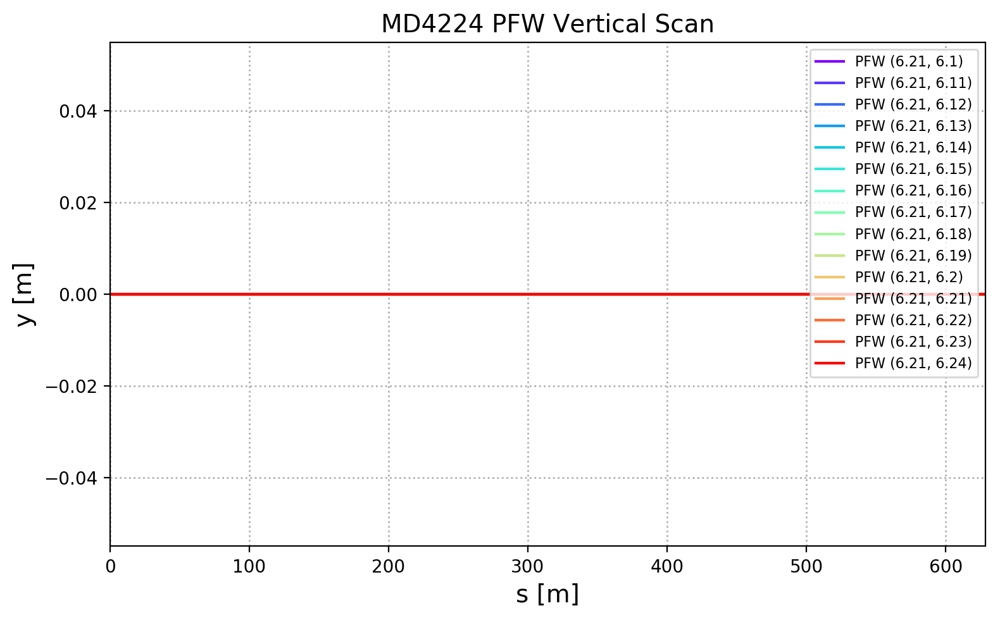

In [41]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

### PFW H Scan

In [42]:
main_label = 'MD4224'
case_label = 'PFW Horizontal Scan'
save_folder = 'PFW_Horizontal/'
make_directory(save_folder)

Creation of the directory PFW_Horizontal/ failed


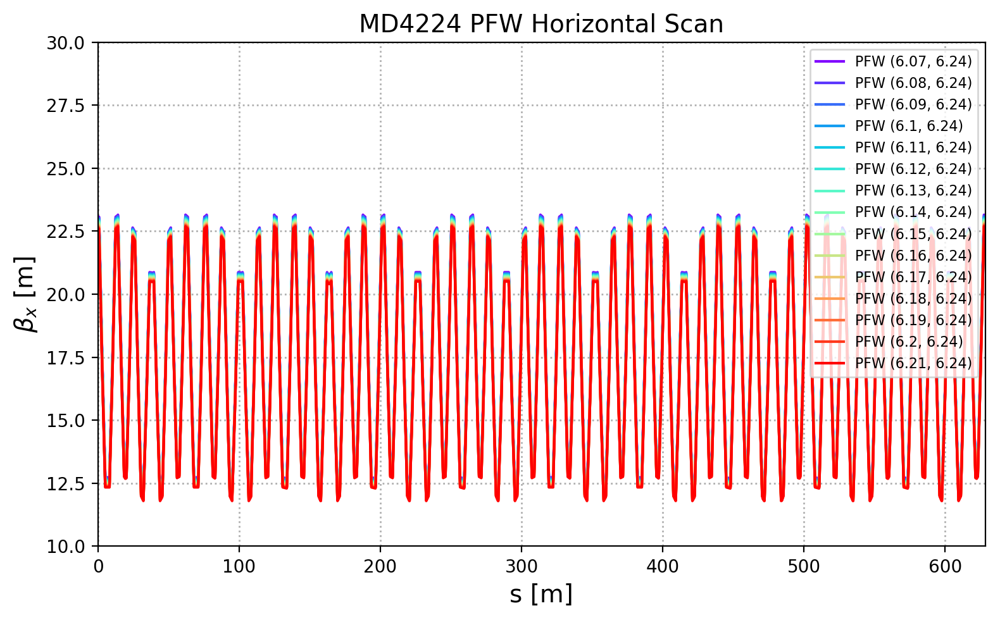

In [43]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

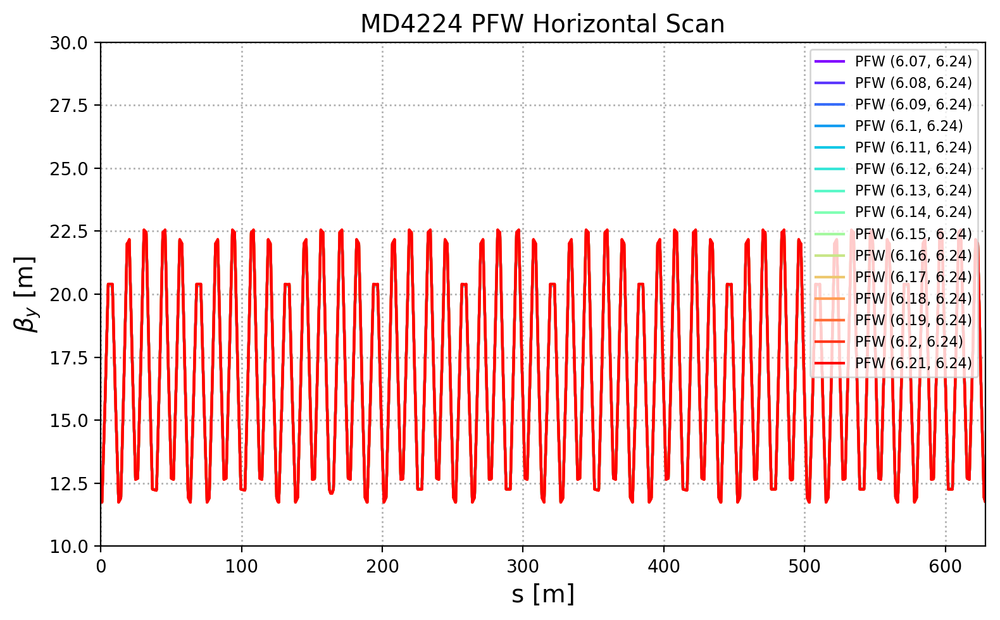

In [44]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

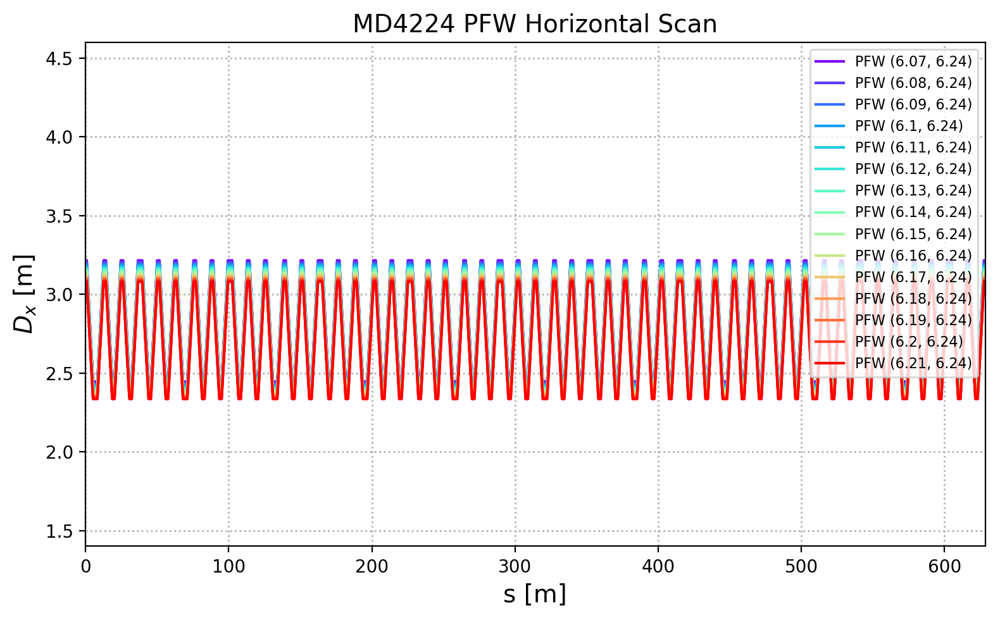

In [45]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(1.4, 4.6)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

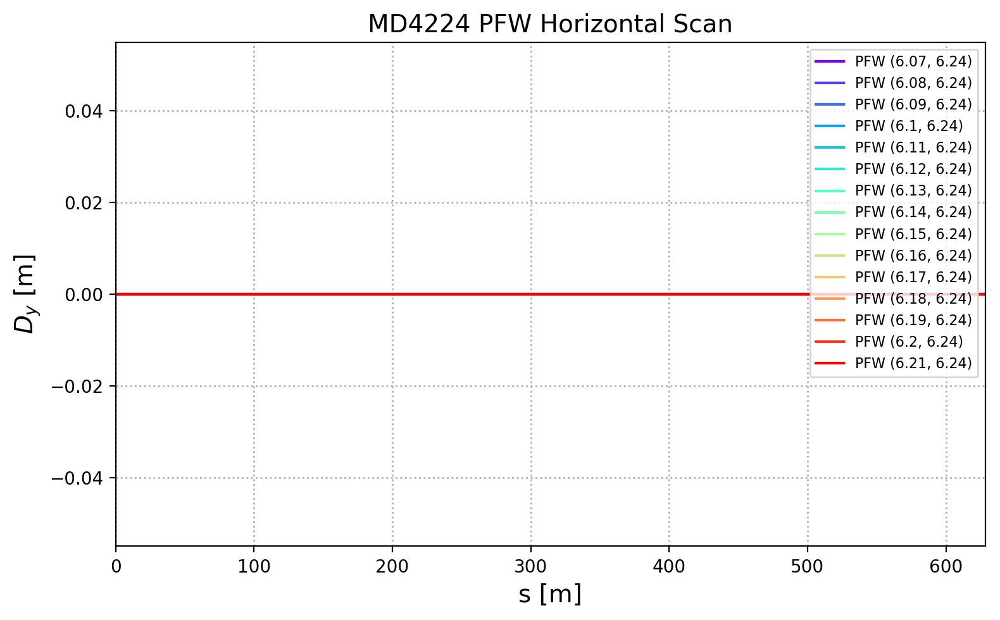

In [46]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

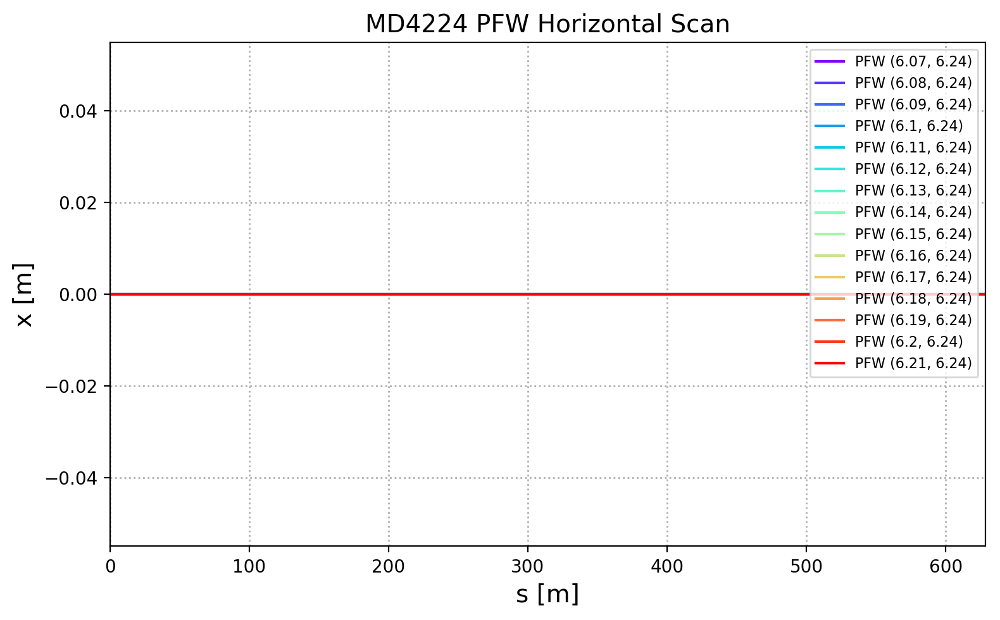

In [47]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

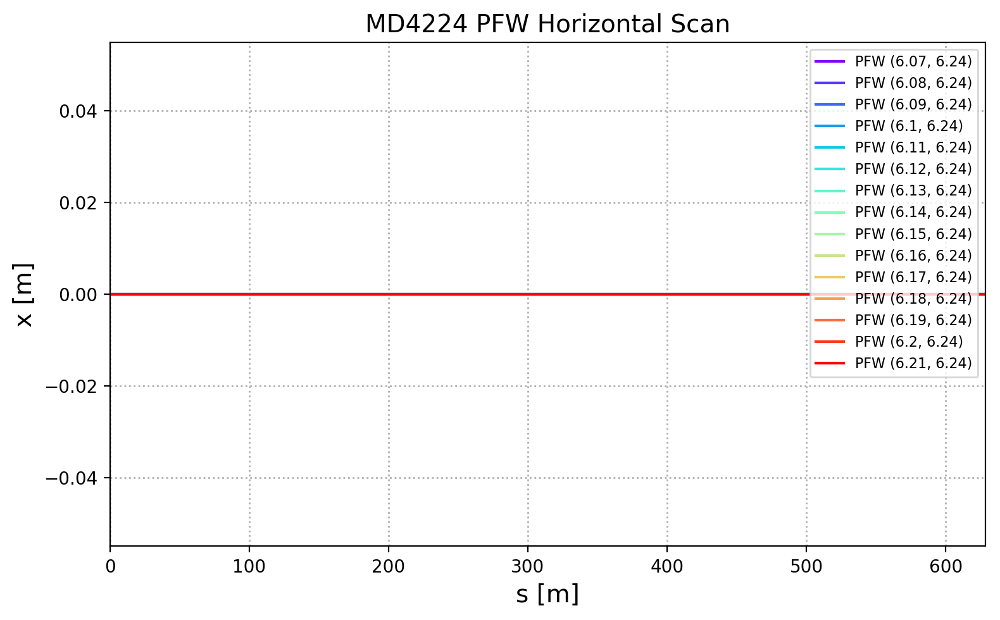

In [48]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

### PFW + quadrupole error

In [49]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan Quad Error'
save_folder = 'PFW_Vertical_Quad/'
make_directory(save_folder)
pcs = ['20 %','15 %', '10 %', '5 %', '0 %']

Creation of the directory PFW_Vertical_Quad/ failed


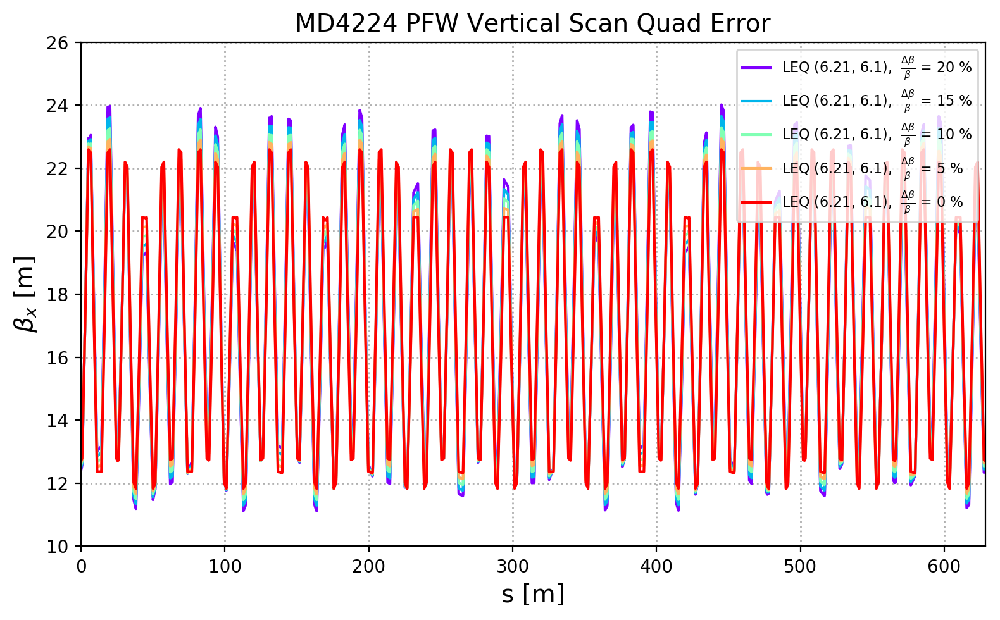

In [50]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10, 26)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

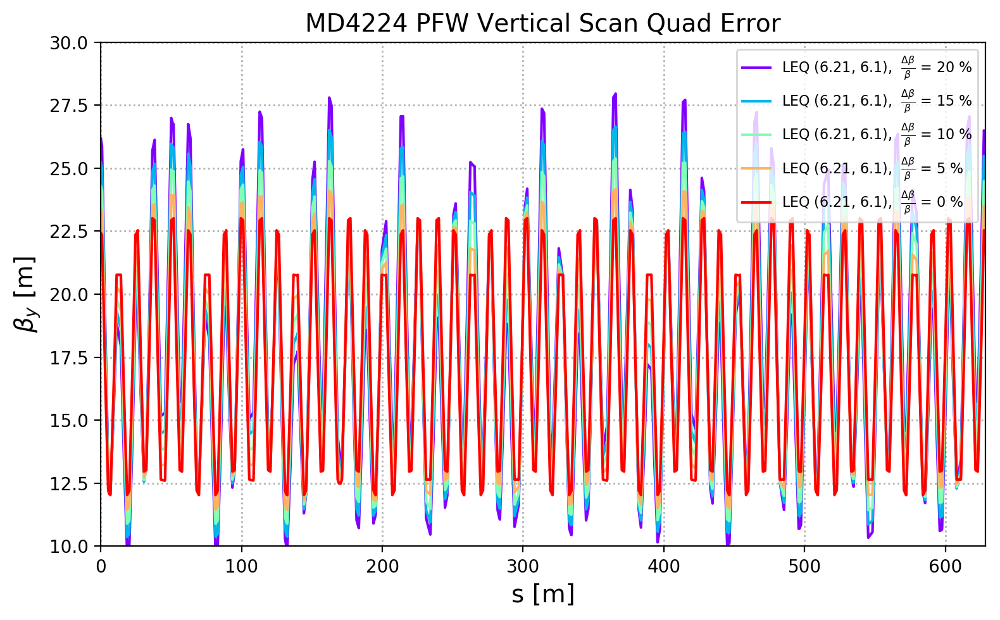

In [51]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(10,30)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

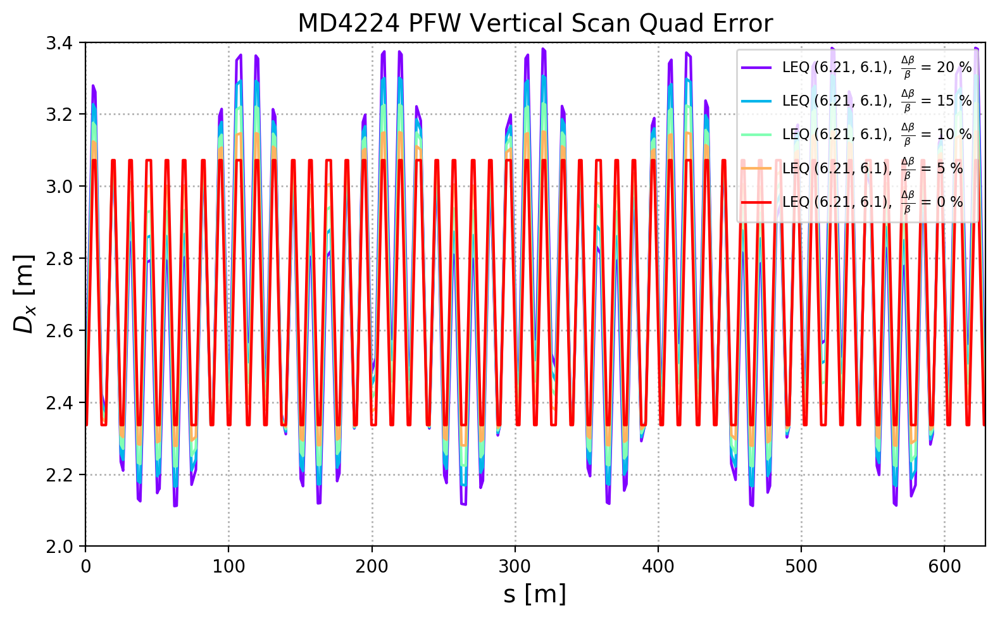

In [52]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(2.0, 3.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

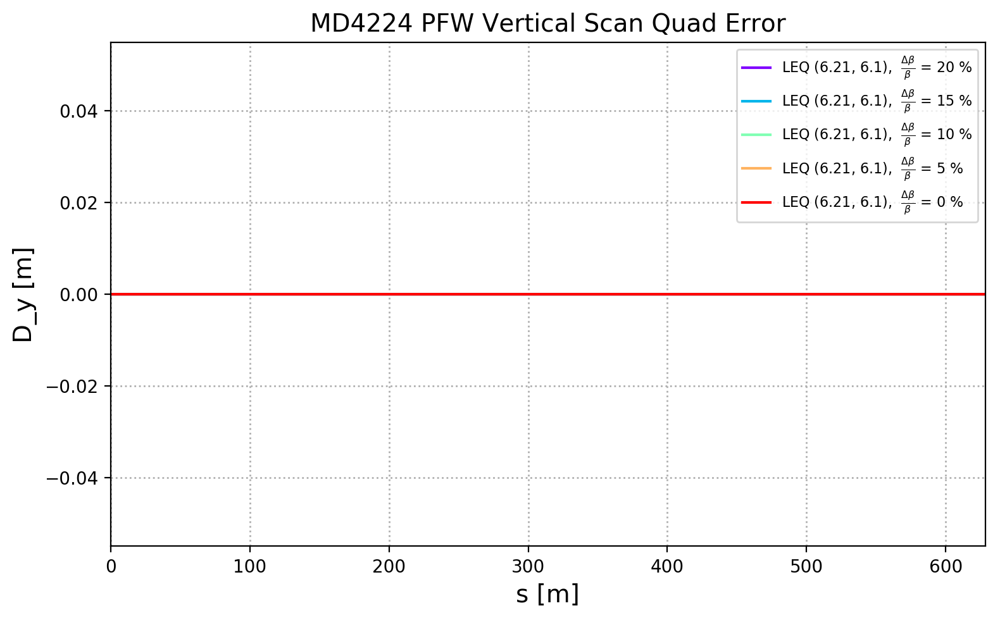

In [53]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('D_y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(np.array(d['S']), np.array(d[parameter])*beta, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

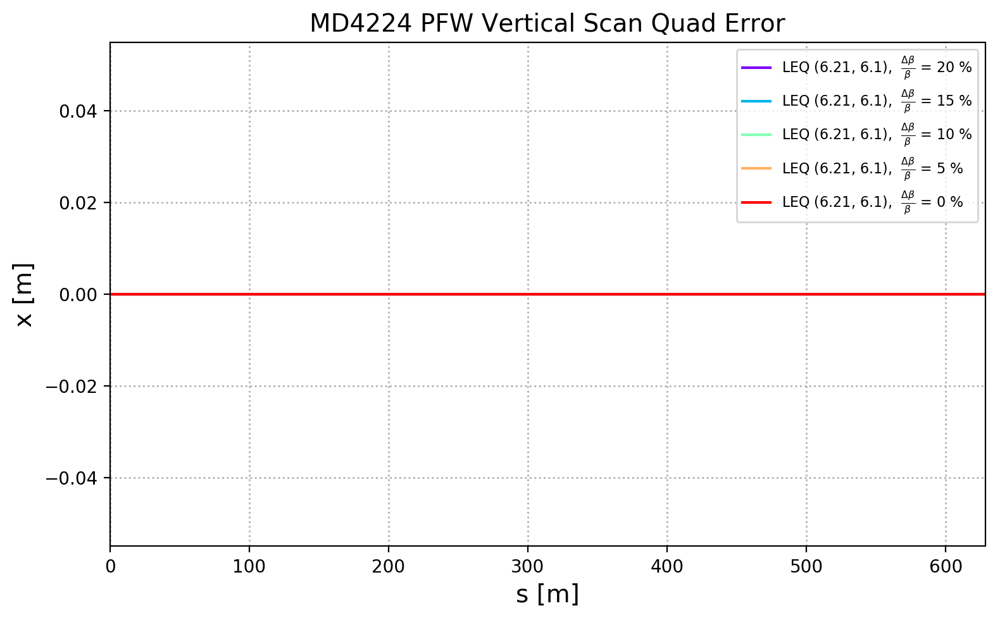

In [54]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

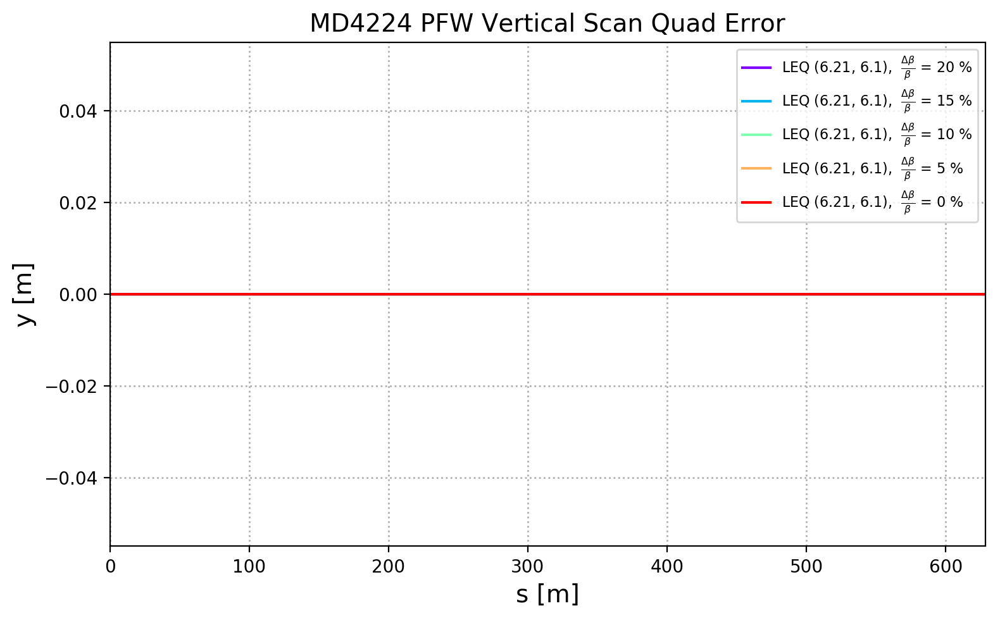

In [55]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + '), ' + r' $\frac{\Delta \beta}{\beta}$ = '+ pcs[c_it] 
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

# Compare beta beating

- Use PFW scan at operational working point as the reference

In [56]:
main_label = 'MD4224'
case_label = 'LEQ Vertical Scan'
save_folder = 'Vertical_Beating/'
make_directory(save_folder)

Creation of the directory Vertical_Beating/ failed


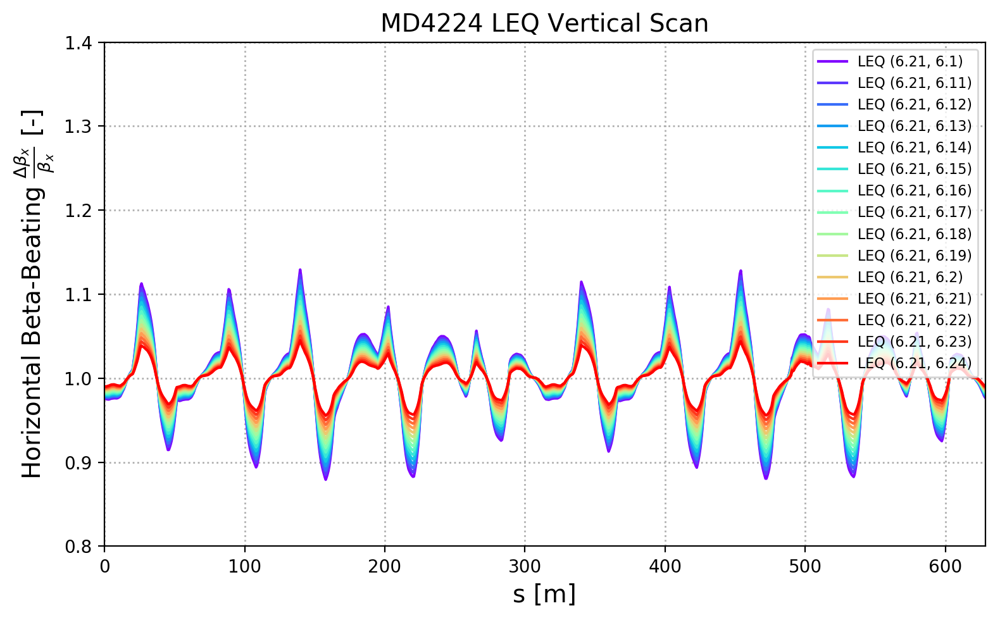

In [57]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Beta-Beating $\frac{\Delta \beta_x}{\beta_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_Beta_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



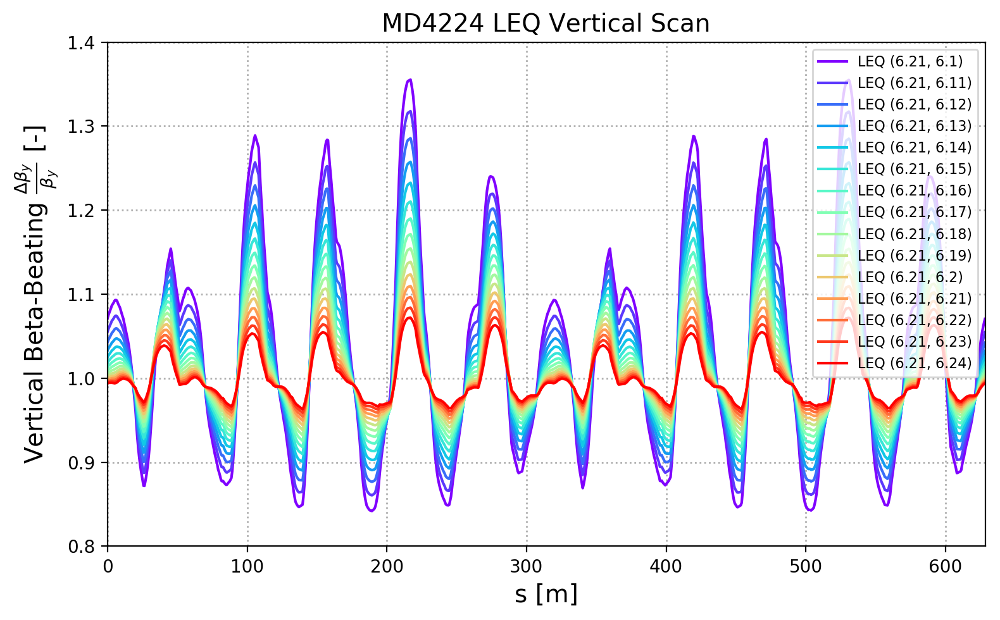

In [58]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    # Interpolate both data sets in order to divide the same number of data points
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)          
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



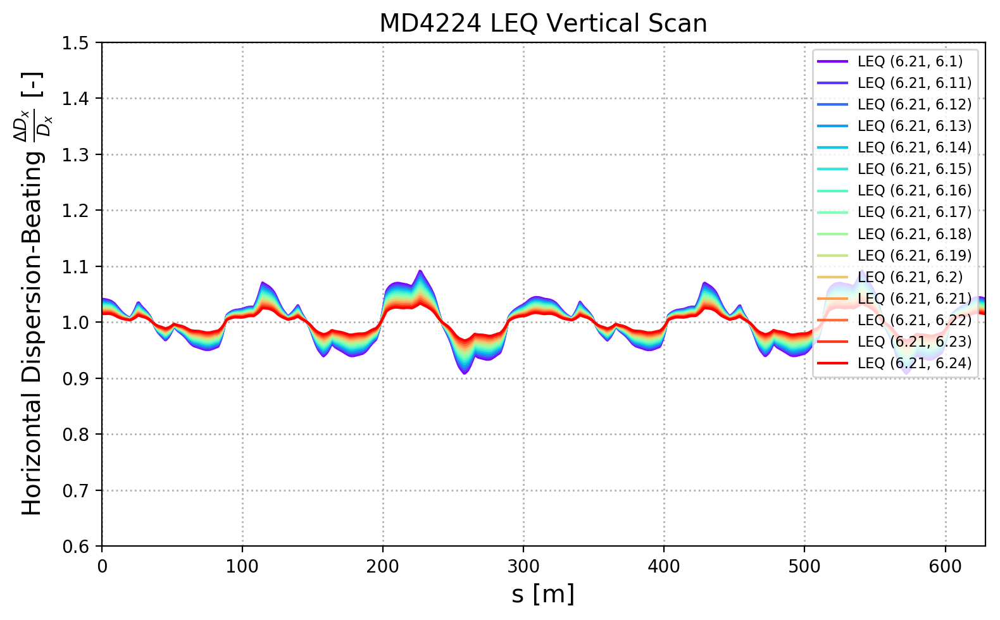

In [59]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Dispersion-Beating $\frac{\Delta D_x}{D_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_ylim(0.9,1.1)
ax1.set_ylim(0.6,1.5)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_D_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



In [60]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan'

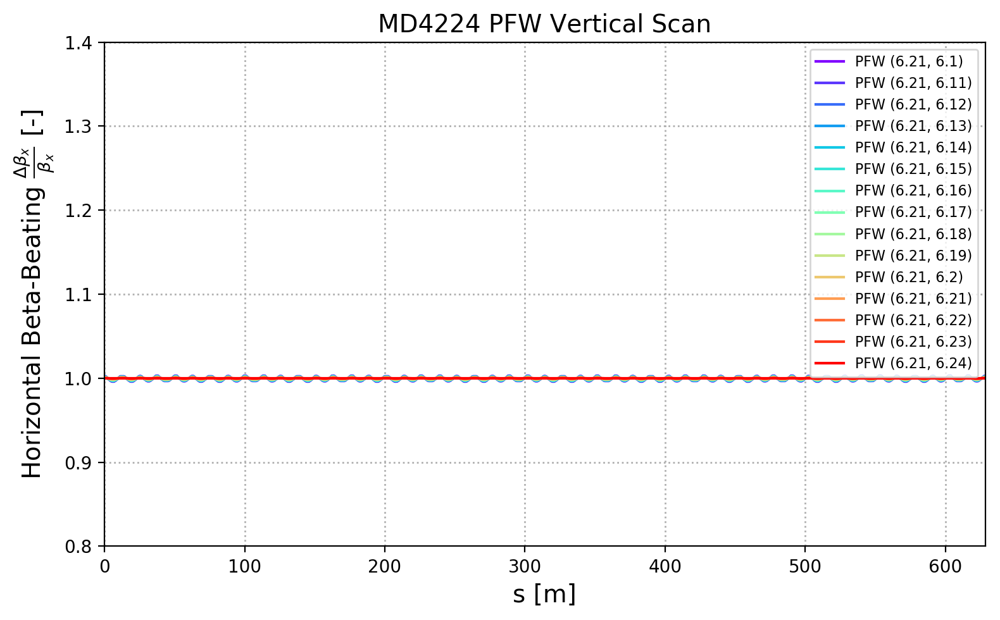

In [61]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Beta-Beating $\frac{\Delta \beta_x}{\beta_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_Beta_Beating_PFW.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



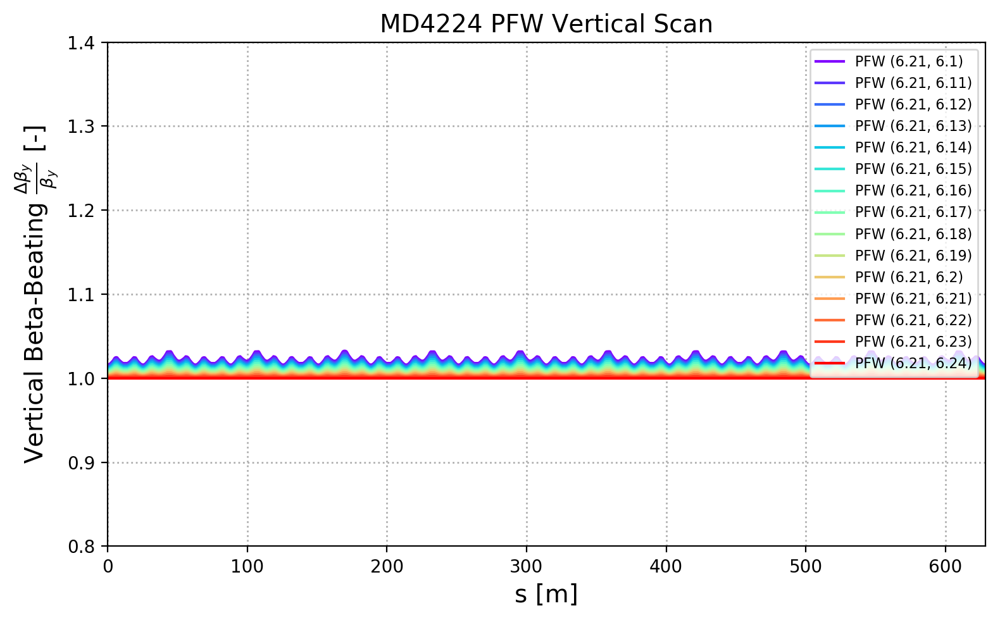

In [62]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    # Interpolate both data sets in order to divide the same number of data points
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)          
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating_PFW.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



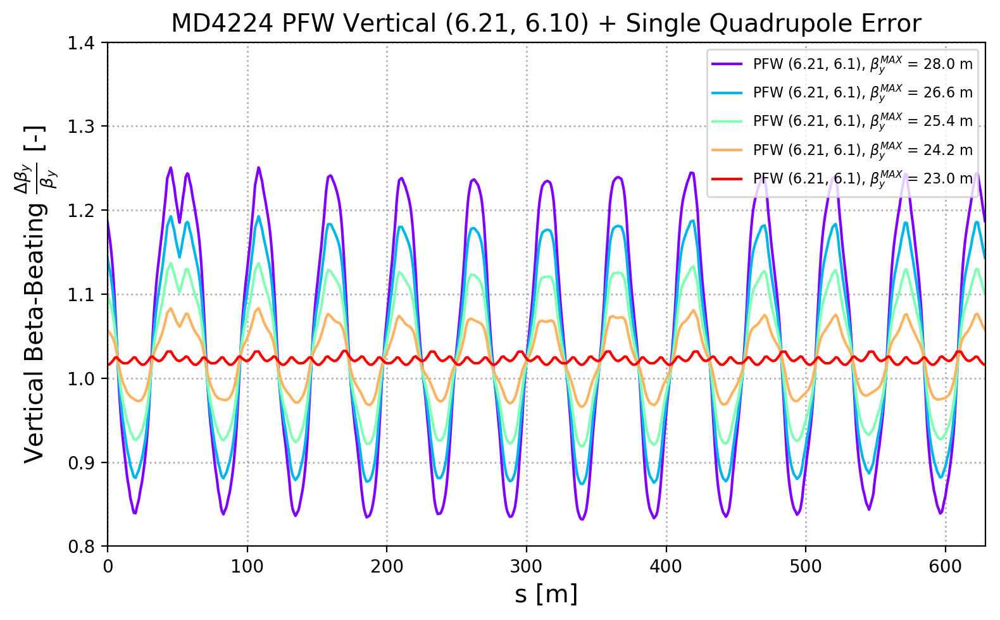

In [63]:
main_label = 'MD4224'
case_label = 'PFW Vertical (6.21, 6.10) + Single Quadrupole Error'
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label# + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + r'), $\beta_y^{MAX}$ = ' + str(round_sig(d['HEADER_BETA_Y_MAX'][0])) + ' m'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_V_24['S'], PFW_V_24[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating_PFW_Quad.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);



In [64]:
main_label = 'MD4224'
case_label = 'LEQ Horizontal Scan'
save_folder = 'Horizontal_Beating/'
make_directory(save_folder)

Creation of the directory Horizontal_Beating/ failed


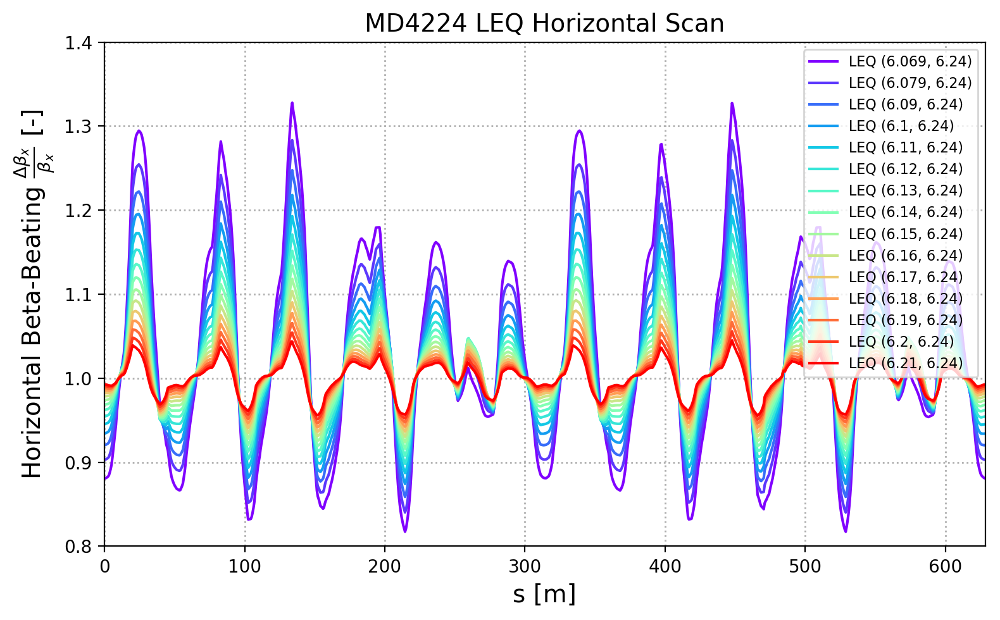

In [65]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Beta-Beating $\frac{\Delta \beta_x}{\beta_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_H_21['S'], PFW_H_21[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_Beta_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

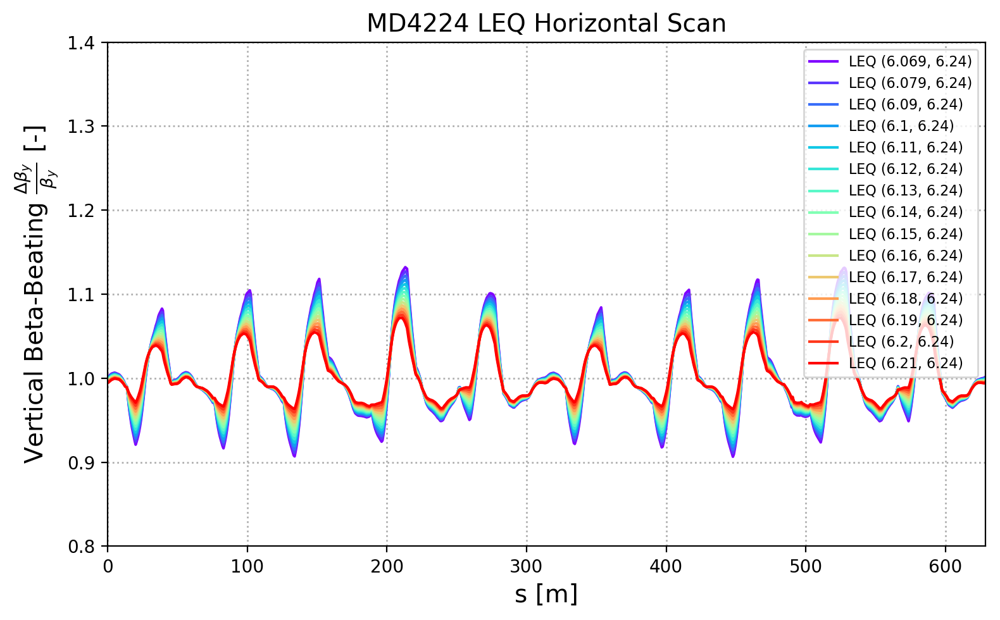

In [66]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_H_21['S'], PFW_H_21[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

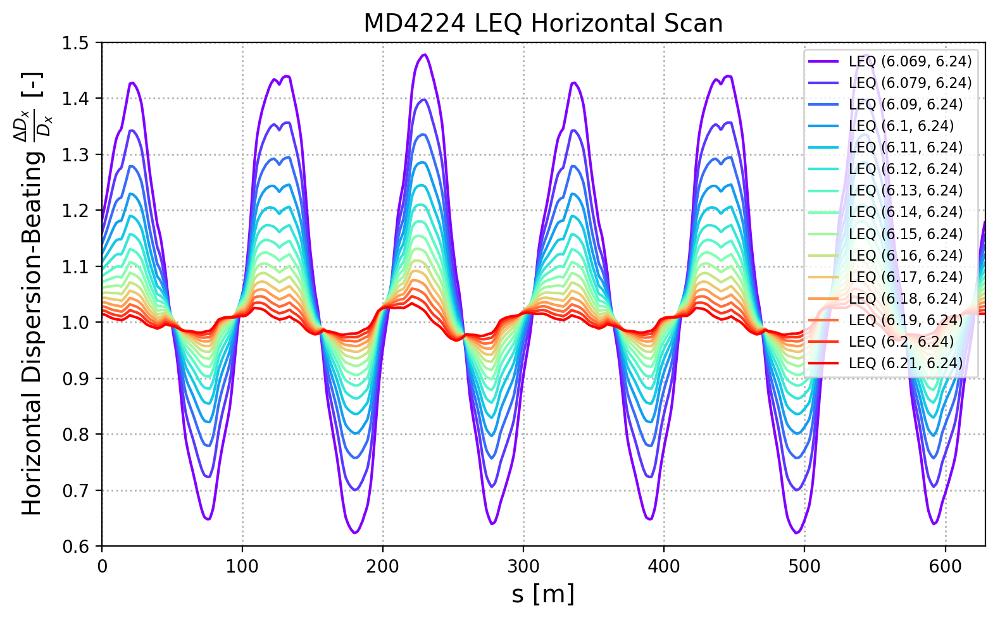

In [67]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Dispersion-Beating $\frac{\Delta D_x}{D_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_H_21['S'], PFW_H_21[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.6,1.5)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_D_Beating.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

In [68]:
main_label = 'MD4224'
case_label = 'PFW Horizontal Scan'

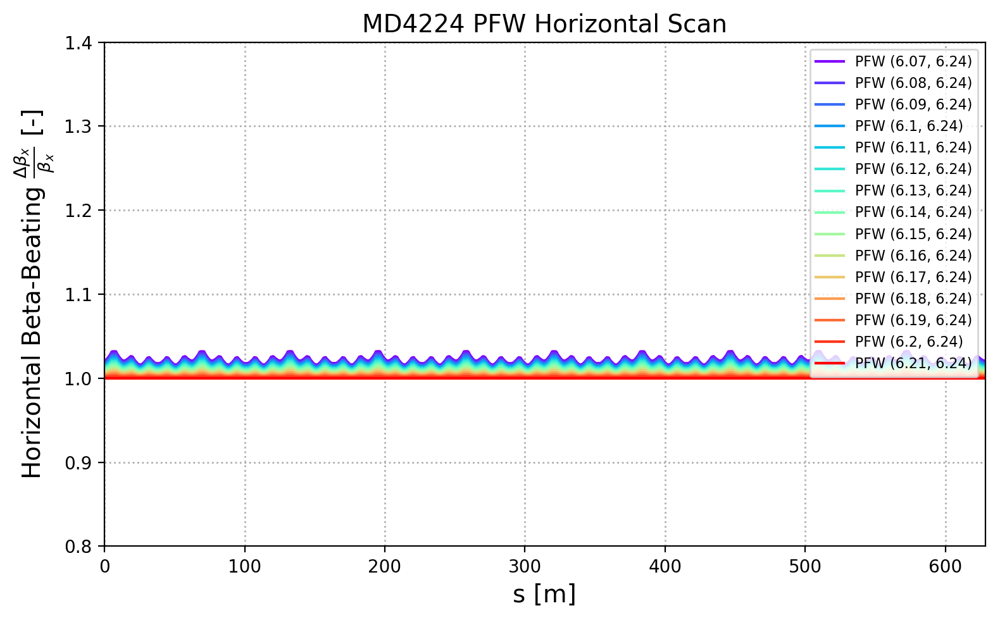

In [69]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Horizontal Beta-Beating $\frac{\Delta \beta_x}{\beta_{x}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_H_21['S'], PFW_H_21[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Horizontal_Beta_Beating_PFW.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

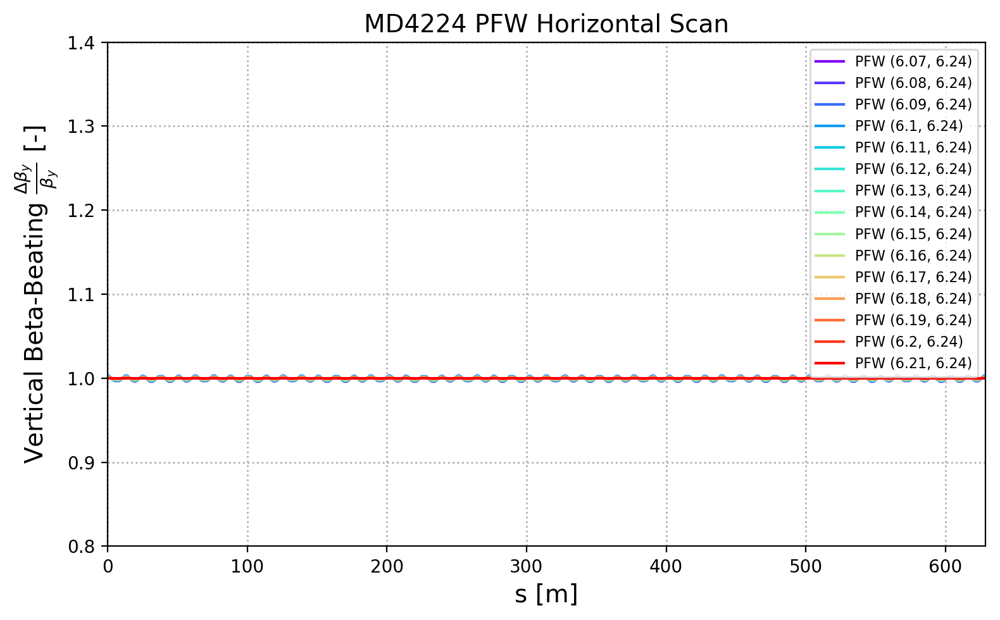

In [70]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label# + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'PFW (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    
    f1 = interpolate.interp1d(d['S'], d[parameter])
    f0 = interpolate.interp1d(PFW_H_21['S'], PFW_H_21[parameter])
    
    x_dat = np.linspace(0., (200.*np.pi-0.1), 1000)      
    
    y_0 = f0(x_dat)
    y_1 = f1(x_dat)
    y_dat = y_1/y_0
    
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_ylim(0.8,1.4)
ax1.set_xlim(0., (200.*np.pi))

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating_PFW.png'
plt.tight_layout()
plt.savefig(savename, dpi = 200);

